# Vehicle Detection Project

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

---
## Perform a Histogram of Oriented Gradients (HOG) feature extraction

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog

from sklearn.model_selection import train_test_split
#from sklearn.cross_validation import train_test_split

def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

def convert_color(image, cspace='RGB'):
    if cspace == 'HSV':     feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    elif cspace == 'LUV':   feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
    elif cspace == 'HLS':   feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    elif cspace == 'YUV':   feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
    elif cspace == 'YCrCb': feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(image)
    return feature_image

images = glob.glob('vehicles/**/*.png', recursive=True) + glob.glob('non-vehicles/**/*.png', recursive=True)
cars = []
notcars = []
for image in images:
    if 'non-vehicles/' in image: # 'image' in image or 'extra' in image:
        notcars.append(image)
    else:
        cars.append(image)

/home/kswaroop/anaconda3/lib/python3.5/site-packages/skimage/feature/_hog.py:88: RuntimeWarning: invalid value encountered in sqrt
  image = np.sqrt(image)


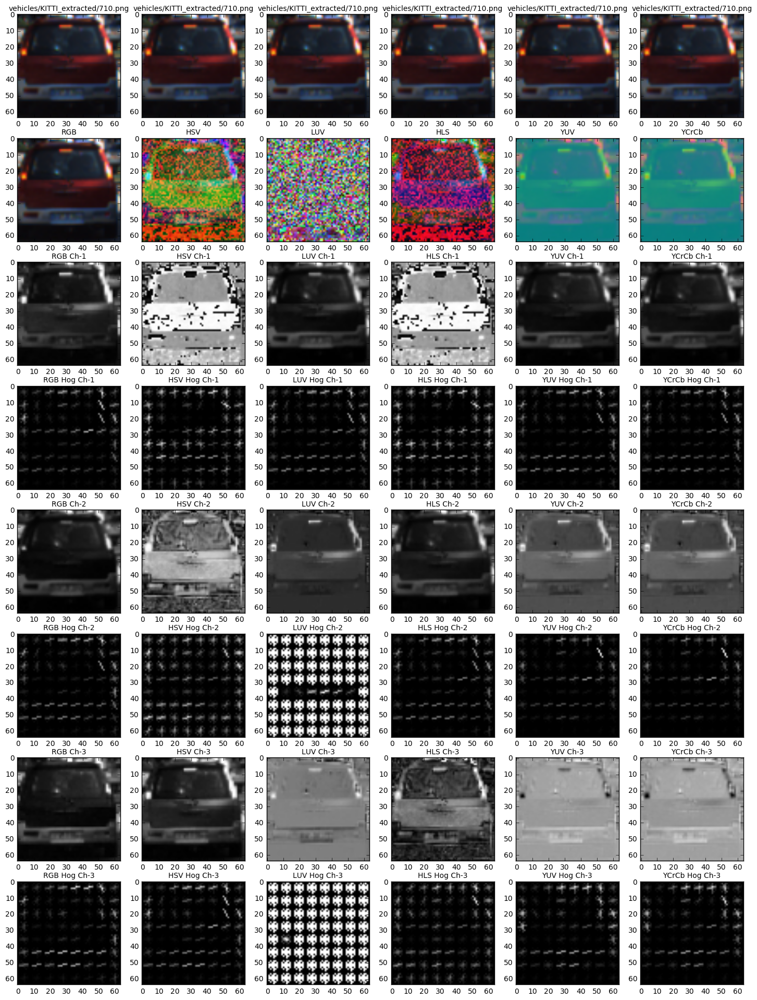

In [2]:
## helper to visualise colorspace exploration
def show_hog_features_colorspace(file, colorspace, ax, yind, xind):
    image=mpimg.imread(file)
    fig_img=convert_color(image, colorspace)
    ch1,ch2,ch3=fig_img[:,:,0],fig_img[:,:,1],fig_img[:,:,2]
    feat1, hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, True, True)
    feat2, hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, True, True)
    feat3, hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, True, True)
    feat = get_hog_features(fig_img[:,:,2], orient, pix_per_cell, cell_per_block, False, False)
    #print(file, feat1.shape, hog1.shape, feat.shape)
    i=0

    ax[yind+i][xind].set_title(file, fontsize=10)
    ax[yind+i][xind].imshow(image)
    i+=1
    ax[yind+i][xind].set_title(colorspace, fontsize=10)
    ax[yind+i][xind].imshow(fig_img)
    i+=1
    ax[yind+i][xind].set_title(colorspace+' Ch-1', fontsize=10)
    ax[yind+i][xind].imshow(ch1, cmap='gray')
    i+=1
    ax[yind+i][xind].set_title(colorspace+' Hog Ch-1', fontsize=10)
    ax[yind+i][xind].imshow(hog1, cmap='gray')
    i+=1
    ax[yind+i][xind].set_title(colorspace+' Ch-2', fontsize=10)
    ax[yind+i][xind].imshow(ch2, cmap='gray')
    i+=1
    ax[yind+i][xind].set_title(colorspace+' Hog Ch-2', fontsize=10)
    ax[yind+i][xind].imshow(hog2, cmap='gray')
    i+=1
    ax[yind+i][xind].set_title(colorspace+' Ch-3', fontsize=10)
    ax[yind+i][xind].imshow(ch3, cmap='gray')
    i+=1
    ax[yind+i][xind].set_title(colorspace+' Hog Ch-3', fontsize=10)
    ax[yind+i][xind].imshow(hog3, cmap='gray')
    i+=1

### Tweak these parameters and see how the results change.
colorspace = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL' #0 # Can be 0, 1, 2, or "ALL"
########


ran_cars=np.random.randint(0,len(cars),2)

f, ax = plt.subplots(8, 6, figsize=(18, 24))
show_hog_features_colorspace(cars[ran_cars[0]], 'RGB', ax, 0, 0)
show_hog_features_colorspace(cars[ran_cars[0]], 'HSV', ax, 0, 1)
show_hog_features_colorspace(cars[ran_cars[0]], 'LUV', ax, 0, 2)
show_hog_features_colorspace(cars[ran_cars[0]], 'HLS', ax, 0, 3)
show_hog_features_colorspace(cars[ran_cars[0]], 'YUV', ax, 0, 4)
show_hog_features_colorspace(cars[ran_cars[0]], 'YCrCb', ax, 0, 5)

plt.show()

/home/kswaroop/anaconda3/lib/python3.5/site-packages/skimage/feature/_hog.py:88: RuntimeWarning: invalid value encountered in sqrt
  image = np.sqrt(image)


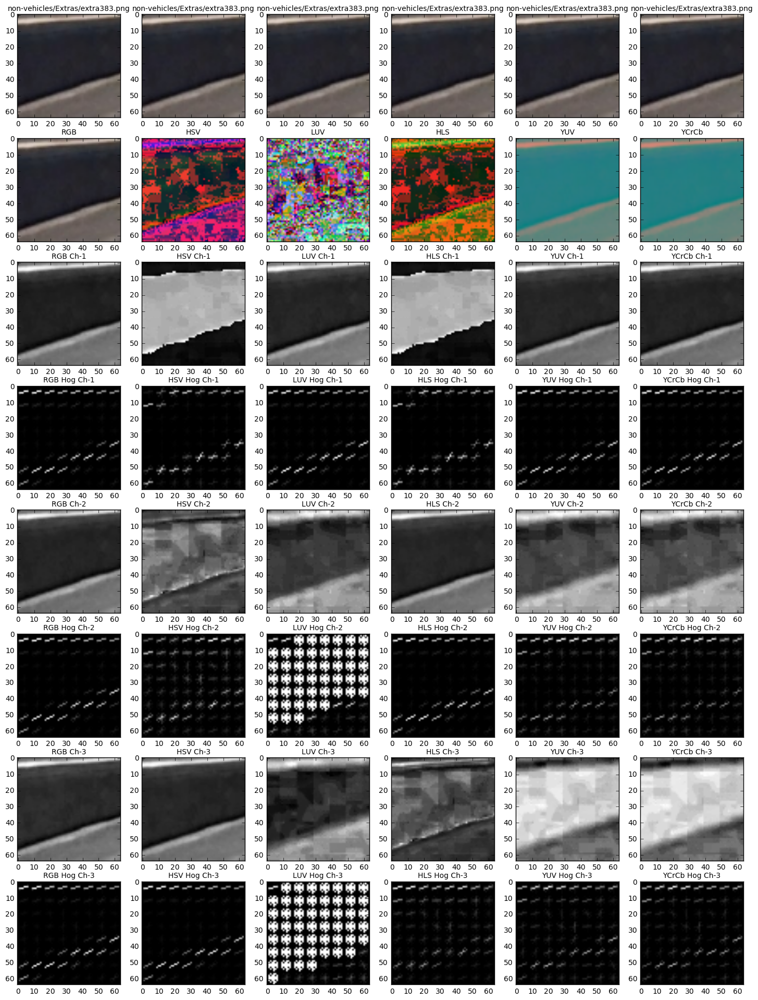

In [3]:
ran_notcars=np.random.randint(0,len(notcars),2)
f, ax = plt.subplots(8, 6, figsize=(18, 24))
show_hog_features_colorspace(notcars[ran_notcars[0]], 'RGB', ax, 0, 0)
show_hog_features_colorspace(notcars[ran_notcars[0]], 'HSV', ax, 0, 1)
show_hog_features_colorspace(notcars[ran_notcars[0]], 'LUV', ax, 0, 2)
show_hog_features_colorspace(notcars[ran_notcars[0]], 'HLS', ax, 0, 3)
show_hog_features_colorspace(notcars[ran_notcars[0]], 'YUV', ax, 0, 4)
show_hog_features_colorspace(notcars[ran_notcars[0]], 'YCrCb', ax, 0, 5)
    
plt.show()

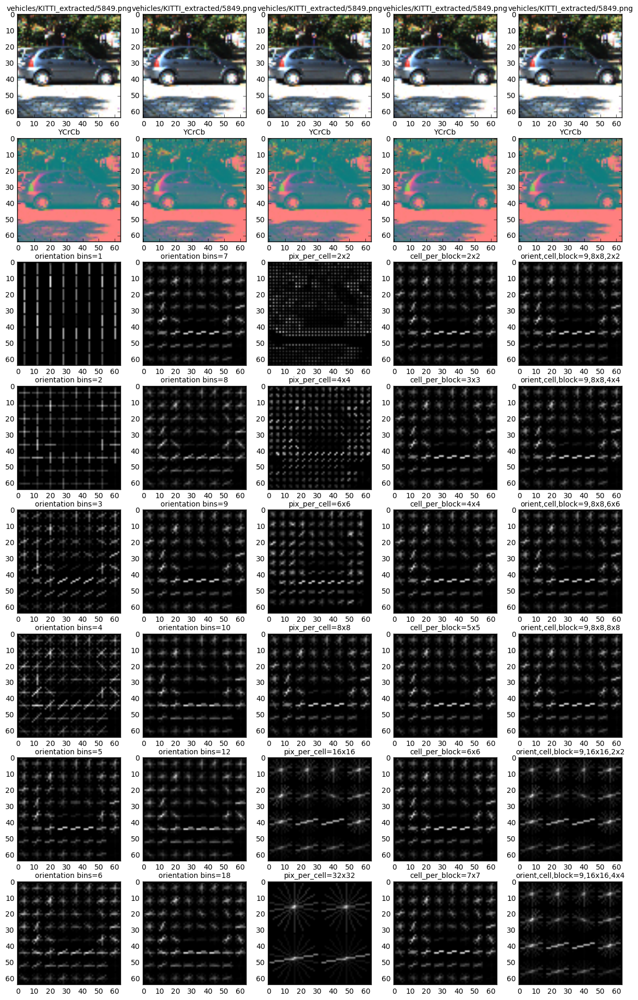

In [4]:
## helper to visualise various other hog parameters exploration
def show_hog_features(file, ax, yind, xind, explore='orient', explore_range=(6,12)):
    image=mpimg.imread(file)
    fig_img=convert_color(image, colorspace)
    ch1,ch2,ch3=fig_img[:,:,0],fig_img[:,:,1],fig_img[:,:,2]

    i=0
    ax[yind+i][xind].set_title(file, fontsize=10)
    ax[yind+i][xind].imshow(image)
    i+=1
    ax[yind+i][xind].set_title(colorspace, fontsize=10)
    ax[yind+i][xind].imshow(fig_img)
    i+=1

    if explore=='orient':
        for orient1 in explore_range:
            title='orientation bins={0}'.format(orient1)
            feat1, hog1 = get_hog_features(ch1, orient1, pix_per_cell, cell_per_block, True, True)
            #feat2, hog2 = get_hog_features(ch2, orient1, pix_per_cell, cell_per_block, True, True)
            #feat3, hog3 = get_hog_features(ch3, orient1, pix_per_cell, cell_per_block, True, True)
            #hog=np.dstack((hog1,hog2,hog3))*255
            #ax[yind+i][xind].imshow(hog)
            ax[yind+i][xind].set_title(title, fontsize=10)
            ax[yind+i][xind].imshow(hog1, cmap='gray')
            i+=1
    elif explore=='pix_per_cell':
        for pix_per_cell1 in explore_range:
            title='pix_per_cell={0}x{0}'.format(pix_per_cell1)
            feat1, hog1 = get_hog_features(ch1, orient, pix_per_cell1, cell_per_block, True, True)
            #feat2, hog2 = get_hog_features(ch2, orient, pix_per_cell1, cell_per_block, True, True)
            #feat3, hog3 = get_hog_features(ch3, orient, pix_per_cell1, cell_per_block, True, True)
            #hog=np.dstack((hog1,hog2,hog3))*255
            ax[yind+i][xind].set_title(title, fontsize=10)
            ax[yind+i][xind].imshow(hog1, cmap='gray')
            i+=1
    elif explore=='cell_per_block':
        for cell_per_block1 in explore_range:
            title='cell_per_block={0}x{0}'.format(cell_per_block1)
            feat1, hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block1, True, True)
            #feat2, hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block1, True, True)
            #feat3, hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block1, True, True)
            #hog=np.dstack((hog1,hog2,hog3))*255
            ax[yind+i][xind].set_title(title, fontsize=10)
            ax[yind+i][xind].imshow(hog1, cmap='gray')
            i+=1
    if explore=='orient,cell,block':
        for orient1,pix_per_cell1,cell_per_block1 in explore_range:
            title='orient,cell,block={0},{1}x{1},{2}x{2}'.format(orient1,pix_per_cell1,cell_per_block1)
            feat1, hog1 = get_hog_features(ch1, orient1, pix_per_cell1, cell_per_block1, True, True)
            #feat2, hog2 = get_hog_features(ch2, orient1, pix_per_cell1, cell_per_block1, True, True)
            #feat3, hog3 = get_hog_features(ch3, orient1, pix_per_cell1, cell_per_block1, True, True)
            #hog=np.dstack((hog1,hog2,hog3))*255
            ax[yind+i][xind].set_title(title, fontsize=10)
            ax[yind+i][xind].imshow(hog1, cmap='gray')
            i+=1

### Use these parameters as default values
colorspace = 'YCrCb' # Used as default color space
orient = 9           # 
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL'  # Can be 0, 1, 2, or "ALL"
########


ran_cars=np.random.randint(0,len(cars),2)
f, ax = plt.subplots(8, 5, figsize=(15, 24))

# twesk the parameters and visualise results
show_hog_features(cars[ran_cars[0]], ax, 0, 0, 'orient', (1,2,3,4,5,6))
show_hog_features(cars[ran_cars[0]], ax, 0, 1, 'orient', (7,8,9,10,12,18))
show_hog_features(cars[ran_cars[0]], ax, 0, 2, 'pix_per_cell', (2,4,6,8,16,32))
show_hog_features(cars[ran_cars[0]], ax, 0, 3, 'cell_per_block', (2,3,4,5,6,7))
show_hog_features(cars[ran_cars[0]], ax, 0, 4, 'orient,cell,block', ((9,8,2),(9,8,4),(9,8,6),(9,8,8),(9,16,2),(9,16,4)))

plt.show()

In [5]:
# Compute binned color features  
def bin_spatial(img, size=(32, 32)):
    features = cv2.resize(img, size).ravel() # Use cv2.resize().ravel() to create the feature vector
    return features

# Compute color histogram features 
def color_hist(img, nbins=32): #, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins) #, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins) #, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins) #, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    return hist_features

# Extract features from a single image window for an single image
# Have this function call bin_spatial() and color_hist() as directed
def extract_features_img(img, color_space='RGB', spatial_size=(32, 32), hist_bins=32, orient=9, 
                         pix_per_cell=8, cell_per_block=2, hog_channel=0,
                         spatial_feat=True, hist_feat=True, hog_feat=True):    
    img_features = []                                    #1) Define an empty list to receive features
    feature_image=convert_color(img, color_space)        #2) Apply color conversion if other than 'RGB'
    if spatial_feat == True:                             #3) Compute spatial features if flag is set
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        img_features.append(spatial_features)            #4) Append features to list
    if hist_feat == True:                                #5) Compute histogram features if flag is set
        hist_features = color_hist(feature_image, nbins=hist_bins)
        img_features.append(hist_features)               #6) Append features to list
    if hog_feat == True:                                 #7) Compute HOG features if flag is set
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], orient, pix_per_cell, cell_per_block))
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, pix_per_cell, cell_per_block)
        img_features.append(hog_features)                 #8) Append features to list
    return np.concatenate(img_features)                   #9) Return concatenated array of features


# Define a function to extract features from a list of images
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32), hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    return [extract_features_img(image, color_space, spatial_size, hist_bins, orient, pix_per_cell, cell_per_block,
                                 hog_channel, spatial_feat, hist_feat, hog_feat)
            for image in [mpimg.imread(file) for file in imgs]]

In [6]:
# Train classifier
from sklearn.utils import shuffle
spatial = 32
histbin = 32

print(len(cars), len(notcars))

t=time.time()
car_features = extract_features(cars, 'YCrCb', (spatial, spatial), histbin, hog_channel='ALL')
notcar_features = extract_features(notcars[:1000], 'YCrCb', (spatial, spatial), histbin, hog_channel='ALL')
t1=time.time()
print('{:0.3} secs to extract features'.format(t1-t))

### Use these parameters as default values
colorspace = 'YCrCb' # Used as default color space
orient = 9           # 
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL'  # Can be 0, 1, 2, or "ALL"

t=time.time()
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
scaled_X, y = shuffle(scaled_X, y)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.1, random_state=rand_state)
#X_train, y_train, X_test, y_test = scaled_X, y, scaled_X, y # use whole data 

print('Using spatial binning of ({0}x{0}) and {1} histogram bins; {2} pix_per_cell, {3} cell_per_block.'
      .format(spatial, histbin, pix_per_cell, cell_per_block))
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print('{:0.3} Seconds to train SVC...'.format(t2-t))
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('SVC predicts:     ', svc.predict(X_test[np.random.randint(0, len(X_test), n_predict)]))
print('For these',n_predict, 'labels: ', y_test[np.random.randint(0, len(X_test), n_predict)])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

8792 9300
50.4 secs to extract features
Using spatial binning of (32x32) and 32 histogram bins; 8 pix_per_cell, 2 cell_per_block.
Feature vector length: 8460
20.9 Seconds to train SVC...
Test Accuracy of SVC =  0.9929
SVC predicts:      [ 1.  1.  0.  1.  1.  1.  1.  1.  1.  1.]
For these 10 labels:  [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]
0.00278 Seconds to predict 10 labels with SVC


In [7]:
# Sliding window implementation
def slide_window_1(x_start_stop, y_start_stop, xy_window, xy_overlap):
    #print(x_start_stop, y_start_stop, xy_window)
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    #print(window_list)
    return window_list

def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], xy_window=(64, 64), xy_overlap=(0.5, 0.5), vis=False):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None: x_start_stop[0] = 0
    if x_start_stop[1] == None: x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None: y_start_stop[0] = 0
    if y_start_stop[1] == None: y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    window_list_1_0 = slide_window_1((np.int(x_start_stop[0]+xspan*1/5), np.int(x_start_stop[0]+xspan*4/5)),
                                     (y_start_stop[0], np.int(y_start_stop[0]+yspan*1/2)),
                                     xy_window, xy_overlap)
    #window_list_1_5_lhs = slide_window_1((x_start_stop[0], np.int(x_start_stop[0]+xspan*2/5)),(y_start_stop[0], np.int(y_start_stop[0]+yspan*3/4)),(np.int(1.5*xy_window[0]), np.int(1.5*xy_window[1])), xy_overlap)
    #window_list_1_5_mid = slide_window_1((np.int(x_start_stop[0]+xspan*2/5), np.int(x_start_stop[1]-xspan*2/5)),(np.int(y_start_stop[0]+yspan*1/4), np.int(y_start_stop[0]+yspan*3/4)),(np.int(1.5*xy_window[0]), np.int(1.5*xy_window[1])), xy_overlap)
    #window_list_1_5_rhs = slide_window_1((np.int(x_start_stop[1]-xspan*2/5), x_start_stop[1]),(y_start_stop[0], np.int(y_start_stop[0]+yspan*3/4)),(np.int(1.5*xy_window[0]), np.int(1.5*xy_window[1])), xy_overlap)
    window_list_2_0_lhs = slide_window_1((x_start_stop[0], np.int(x_start_stop[0]+xspan*2/5)),
                                         y_start_stop,
                                         (2*xy_window[0], 2*xy_window[1]), xy_overlap)
    window_list_2_0_mid = slide_window_1(x_start_stop, 
                                         (np.int(y_start_stop[0]+yspan*1/2), y_start_stop[1]),
                                         (2*xy_window[0], 2*xy_window[1]), xy_overlap)
    window_list_2_0_rhs = slide_window_1((np.int(x_start_stop[1]-xspan*2/5), x_start_stop[1]),
                                         y_start_stop,
                                         (2*xy_window[0], 2*xy_window[1]), xy_overlap)
    #ret = window_list_1_0 + window_list_1_5_lhs + window_list_1_5_mid + window_list_1_5_rhs + window_list_2_0_lhs + window_list_2_0_mid + window_list_2_0_rhs
    ret = window_list_1_0 + window_list_2_0_lhs + window_list_2_0_mid + window_list_2_0_rhs
    if vis:
        img = np.copy(img)
        img = draw_boxes(img, window_list_1_0, color=(0, 0, 255), thick=2)
        #img = draw_boxes(img, window_list_1_5_lhs, color=(0, 255, 255), thick=4)
        #img = draw_boxes(img, window_list_1_5_mid, color=(0, 255, 255), thick=4)
        #img = draw_boxes(img, window_list_1_5_rhs, color=(0, 255, 255), thick=4)
        img = draw_boxes(img, window_list_2_0_lhs, color=(255, 255, 0), thick=2)
        img = draw_boxes(img, window_list_2_0_mid, color=(255, 255, 0), thick=2)
        img = draw_boxes(img, window_list_2_0_rhs, color=(255, 255, 0), thick=2)
        return ret, img
    return ret

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    imcopy = np.copy(img)
    for bbox in bboxes:
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    return imcopy

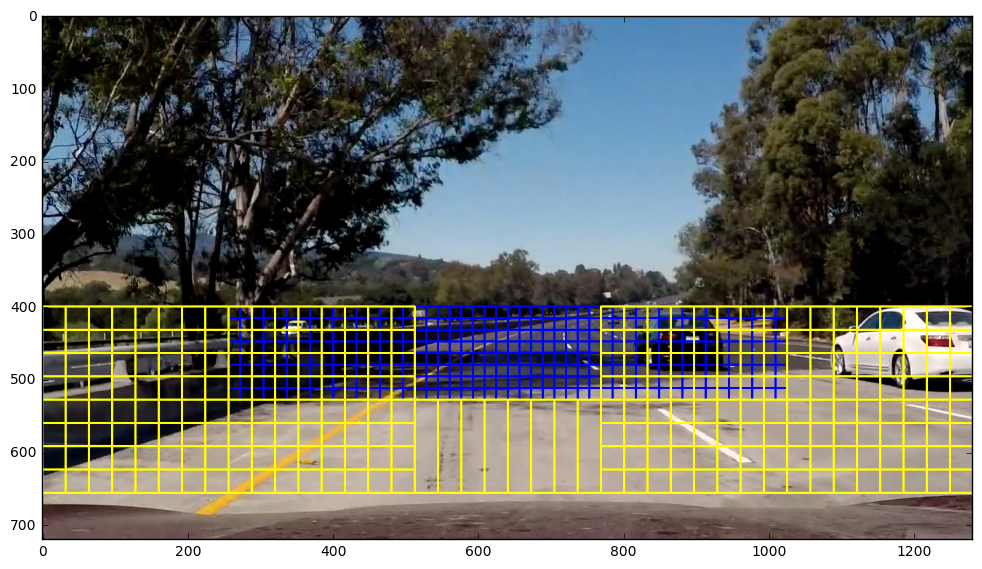

In [8]:
image = mpimg.imread('test_images/test5.jpg')
windows, window_img = slide_window(image, x_start_stop=[None, None], y_start_stop=[400, 656],
                                   xy_window=(64, 64), xy_overlap=(0.75, 0.75), vis=True)
#window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=1)
plt.figure(figsize=(12,18))
plt.imshow(window_img)
plt.show()

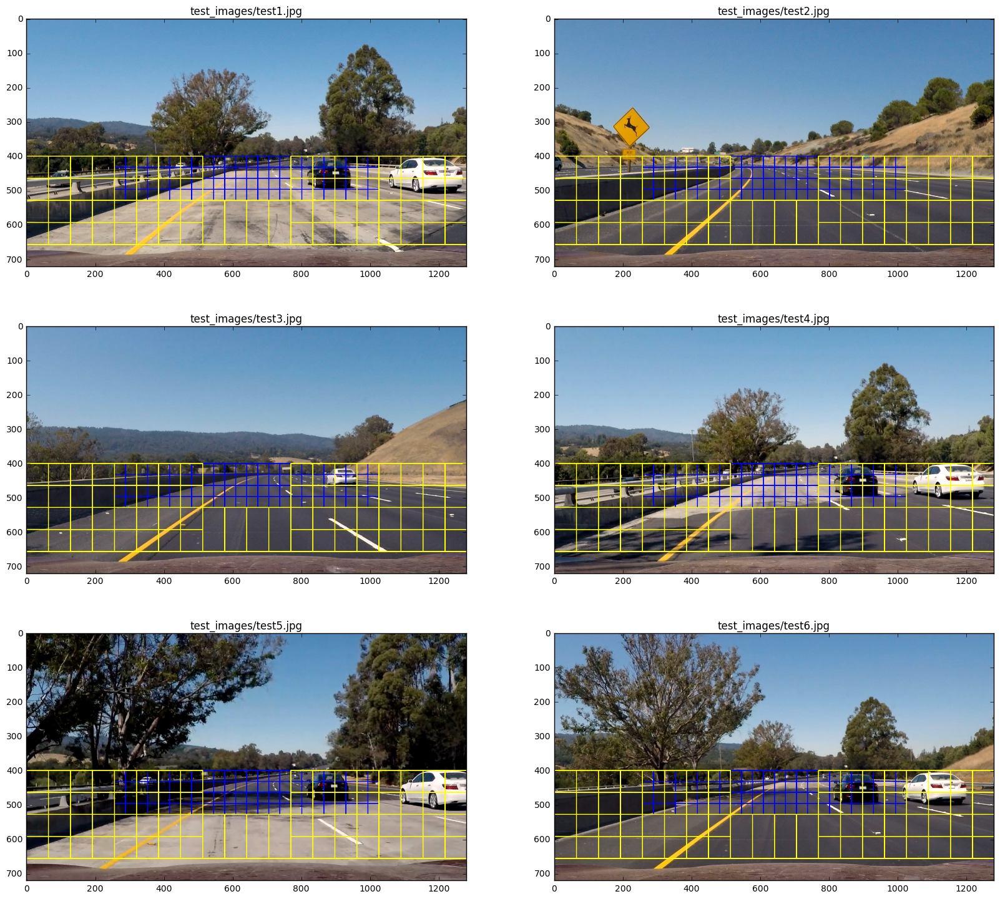

In [9]:
test_files = glob.glob('test_images/test*.jpg')
test_images = {test_file:mpimg.imread(test_file) for test_file in test_files}
n_rows=len(test_images)//2 + len(test_images)%2
f, ax = plt.subplots(n_rows, 2, figsize=(20, n_rows*6))
ind=0

for test_file in test_files:
    image = test_images[test_file]
    windows, window_img = slide_window(image, x_start_stop=[None, None], y_start_stop=[400, 656], xy_window=(64, 64), xy_overlap=(0.5, 0.5), vis=True)
    #window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=1)
    ax[ind//2][ind%2].set_title(test_file)
    ax[ind//2][ind%2].imshow(window_img)
    ind+=1

plt.show()


In [10]:
# Searches using the list of windows to be searched (output of slide_windows()) in the image passed in
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = extract_features_img(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

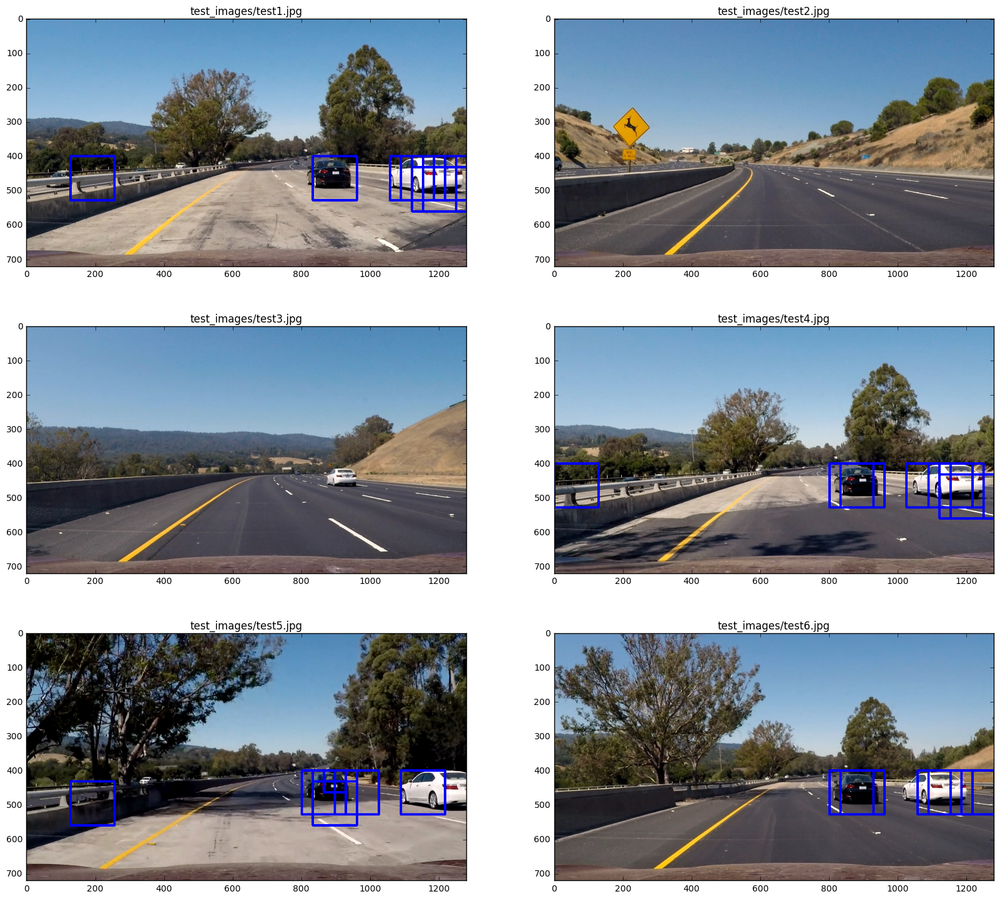

In [11]:
n_rows=len(test_images)//2 + len(test_images)%2
f, ax = plt.subplots(n_rows, 2, figsize=(20, n_rows*6))
ind=0
windows = slide_window(test_images[test_files[0]], x_start_stop=[None, None], 
                       y_start_stop=[400, 656], xy_window=(64, 64), xy_overlap=(0.75, 0.75))

for test_file in test_files:
    image=test_images[test_file]
    draw_image = np.copy(image)
    image = image.astype(np.float32)/255   # read jpg file, but trained on png
    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=colorspace, 
                        spatial_size=(spatial,spatial), hist_bins=histbin, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)                       

    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    
    ax[ind//2][ind%2].set_title(test_file)
    ax[ind//2][ind%2].imshow(window_img)
    ind+=1

plt.show()

In [12]:
from scipy.ndimage.measurements import label
def add_heat(heatmap, bbox_list, inc=1):
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += inc
    return heatmap
    
def apply_threshold(heatmap, threshold):
    heatmap[heatmap <= threshold] = 0
    return heatmap

def draw_labeled_bboxes(img, labels, color=(0, 0, 255), thick=6):
    for car_number in range(1, labels[1]+1):
        nonzero = (labels[0] == car_number).nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        cv2.rectangle(img, bbox[0], bbox[1], color, thick)
    return img

In [15]:
from collections import deque

# track positions of positive detections in previous N frames
# use heatmap with thresholding over them to overcome flase positives
class Vehicles():
    averageOver=6
    threshold=3
    def __init__(self, imShape):
        self.recent_boxes = deque(maxlen=self.averageOver)
        for i in range(self.averageOver): self.recent_boxes.append([])
        self.imShape = imShape
        self.heat = np.zeros(self.imShape).astype(np.float)
        self.heatmap = None
        self.labels = None
        self.car_box = {}

    def iterate(self, hot_windows, img):
        #if len(self.recent_boxes)>=self.averageOver: self.heat = add_heat(self.heat, self.recent_boxes[0], -1)
        #self.heat = #self.heat[:,:]=0
        add_heat(self.heat, self.recent_boxes[0], -1)
        self.recent_boxes.append(hot_windows)
        self.heat = add_heat(self.heat, hot_windows)
        self.heatmap = apply_threshold(np.copy(self.heat), self.threshold) #self.averageOver)
        self.heatmap = np.clip(self.heatmap, 0, 255)
        self.labels = label(self.heatmap)
        self.car_box = {}        
        for car_number in range(1, self.labels[1]+1):
            nonzero = (self.labels[0] == car_number).nonzero()
            nonzeroy = np.array(nonzero[0])
            nonzerox = np.array(nonzero[1])
            bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
            self.car_box[car_number] = bbox
            cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
        return img

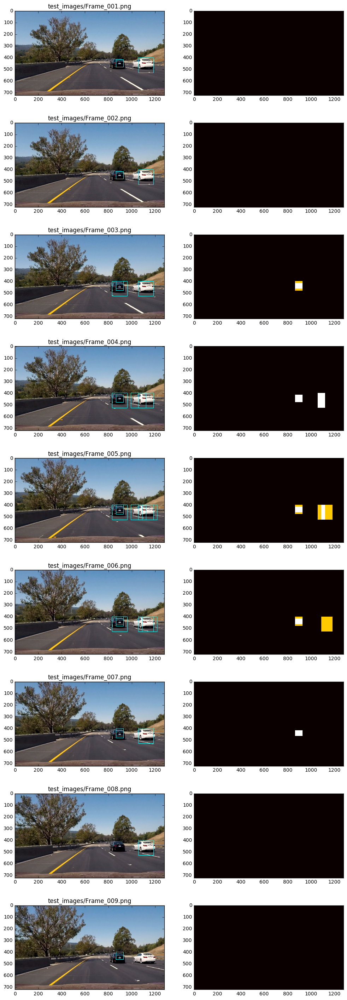

In [20]:
frame_files = glob.glob('test_images/Frame_00?.png')

f, ax = plt.subplots(len(frame_files), 2, figsize=(12, len(frame_files)*4))
ind=0
windows = slide_window(test_images[test_files[0]], x_start_stop=[None, None], y_start_stop=[400, 656], 
                       xy_window=(64, 64), xy_overlap=(0.75, 0.75))

vehicles = Vehicles((720,1280))
all_hot_windows=[]
for test_file in frame_files:
    image=mpimg.imread(test_file)
    
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=colorspace, spatial_size=(spatial,spatial), hist_bins=histbin, orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel)
    all_hot_windows.append(hot_windows)
    window_img = draw_boxes(np.copy(image), hot_windows, color=(0, 1, 1), thick=2)
    heat = add_heat(heat, hot_windows)
    heat = apply_threshold(heat, 1)
    heatmap = np.clip(heat, 0, 255)
    #labels = label(heatmap)
    #draw_img = draw_labeled_bboxes(np.copy(image), labels)
    ax[ind][0].set_title(test_file)
    ax[ind][0].imshow(window_img)
    ax[ind][1].imshow(heatmap, cmap='hot')
    #ax[ind][2].imshow(draw_img)
    ind+=1
    
plt.show()

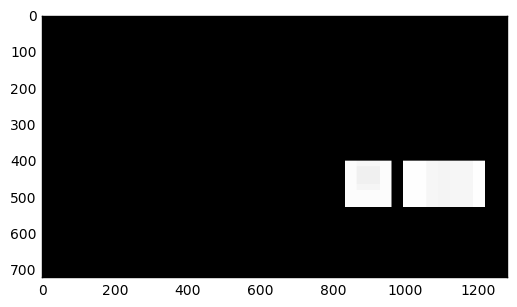

In [21]:
heat = np.zeros_like(image).astype(np.float)
for hot_windows in all_hot_windows:
    #print(hot_windows)
    heat = add_heat(heat, hot_windows)
#heat = apply_threshold(heat, len(frame_files))
heatmap = np.clip(heat, 0, 255)
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(image), labels, color=(0, 0, 1))
plt.imshow(heatmap, cmap='hot')
plt.show()

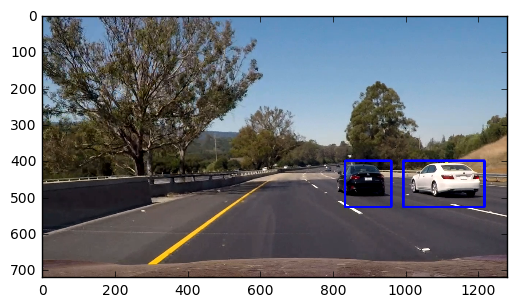

In [22]:
plt.imshow(draw_img)
plt.show()

In [23]:
# uses sliding windows search, and averaging over last N frames, very slow
def find_cars_orig(vehicles, img, windows, clf, scaler, color_space='RGB', spatial_size=(32, 32), hist_bins=32,
                   hist_range=(0, 256), orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0,
                   spatial_feat=True, hist_feat=True, hog_feat=True, vis=False, integrate=True, scalejpg=True):
    if scalejpg: image_normalised = np.copy(img).astype(np.float32)/255   # read jpg file, but trained on png
    else: image_normalised = img
    hot_windows = search_windows(image_normalised, windows, svc, X_scaler, color_space=colorspace, 
                                 spatial_size=(spatial,spatial), hist_bins=histbin, 
                                 orient=orient, pix_per_cell=pix_per_cell, 
                                 cell_per_block=cell_per_block, 
                                 hog_channel=hog_channel)
    img = vehicles.iterate(hot_windows, img)
    if vis:
        window_img = draw_boxes(np.copy(img), hot_windows, color=(0, 150, 150), thick=2)
        heatmap = np.copy(vehicles.heatmap)
        return img, window_img, heatmap
    return img

In [24]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
ystart = 400
ystop = 656
scale = 1.5
orient=9
pix_per_cell=8
cell_per_block=2
spatial_size=(32, 32)
hist_bins=32

print(spatial, colorspace, histbin, orient, pix_per_cell, cell_per_block, hog_channel, svc, X_scaler)
test_image = mpimg.imread('test_images/test5.jpg')
windows = slide_window(test_image, x_start_stop=[None, None], y_start_stop=[400, 656], 
                       xy_window=(64, 64), xy_overlap=(0.75, 0.75))
#print(windows)
Cars=Vehicles((720,1280))  # reinitialise


def process_image(img):
    #return img
    img, window_img, heatmap = find_cars_orig(Cars, img, windows, svc, X_scaler, color_space=colorspace, 
                          spatial_size=(spatial,spatial), hist_bins=histbin, orient=orient, 
                          pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                          hog_channel=hog_channel, vis=True)
    return window_img


vidname='test_video'
output = vidname+'_output.mp4'
clip1 = VideoFileClip(vidname+'.mp4')

clip = clip1.fl_image(process_image)
%time clip.write_videofile(output, audio=False)

32 YCrCb 32 9 8 2 ALL LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0) StandardScaler(copy=True, with_mean=True, with_std=True)
[MoviePy] >>>> Building video test_video_output.mp4
[MoviePy] Writing video test_video_output.mp4


 97%|█████████▋| 38/39 [01:18<00:01,  1.99s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_output.mp4 

CPU times: user 5min 9s, sys: 6.34 s, total: 5min 15s
Wall time: 1min 19s


In [25]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, vis=False):
    draw_img = np.copy(img) if vis else None
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, 'YCrCb') # conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    hot_windows=[]
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                x0,y0,x1,y1=xbox_left, ytop_draw+ystart, xbox_left+win_draw, ytop_draw+win_draw+ystart
                hot_windows.append(((x0, y0), (x1, y1)))
                if vis: cv2.rectangle(draw_img,(x0, y0),(x1, y1),(0,190,190), 1)
    if vis: return hot_windows, draw_img
    return hot_windows

In [26]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
ystart = 400
ystop = 656
scale = 1.5
orient=9
pix_per_cell=8
cell_per_block=2
spatial_size=(32, 32)
hist_bins=32

Cars=Vehicles((720,1280)) # reinitialise

def process_image(img):
    #hot_windows, out_img = find_cars(img, ystart, ystop, scale=1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, vis=True)
    hot_windows = find_cars(img,ystart,ystop,1.5,svc,X_scaler,orient,pix_per_cell,cell_per_block,spatial_size,hist_bins)
    #hot_windows += find_cars(img,ystart,ystop,2.0,svc,X_scaler,orient,pix_per_cell,cell_per_block,spatial_size,hist_bins)
    out_img = np.copy(img)
    for ((x0,y0),(x1,y1)) in hot_windows:
        cv2.rectangle(out_img,(x0, y0),(x1, y1),(0,190,190), 1)
    return Cars.iterate(hot_windows, out_img)

In [27]:
vidname='project_video'
output = vidname+'_output.mp4'
clip1 = VideoFileClip(vidname+'.mp4')
Cars=Vehicles((720,1280)) # reinitialise
#Vehicles.averageOver=6
#Vehicles.threshold=3
clip = clip1.fl_image(process_image)
%time clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [09:39<00:00,  2.16it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 49min 47s, sys: 1min 30s, total: 51min 17s
Wall time: 9min 40s


In [28]:
HTML("""
<video width="{}" height="{}" controls>
  <source src="{}">
</video>
""".format(1280*.75,720*.75,output))